The name of the video is: pexels-jun-ho-lee-9781279.mp4. 
Would you like to approach with this video? Yes/No. 
If No, please enter the index number of video address.


No
0


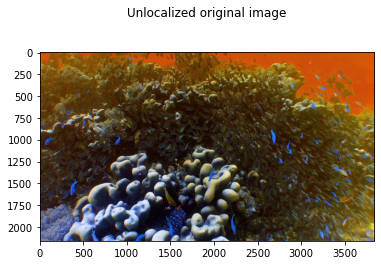

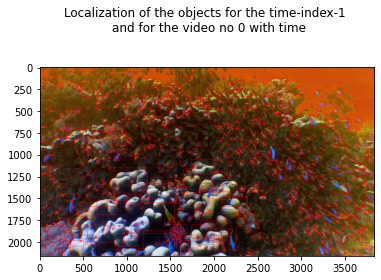

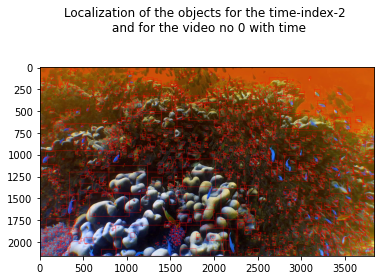

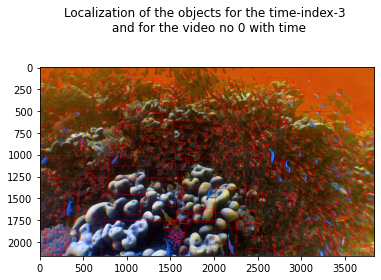

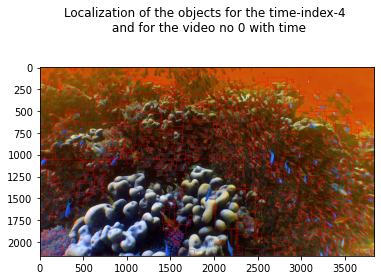

...

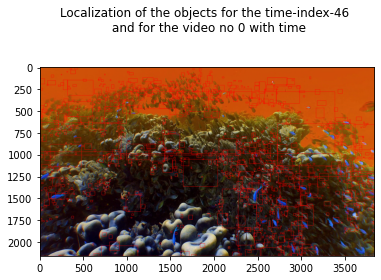

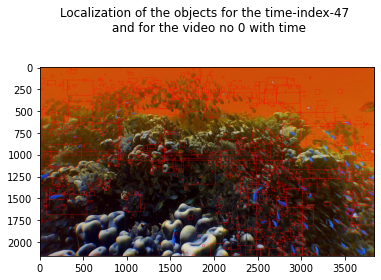

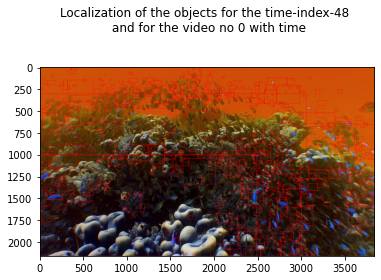

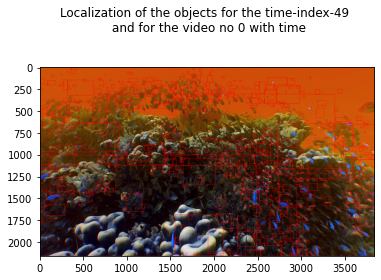

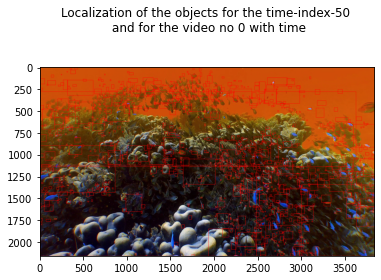

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


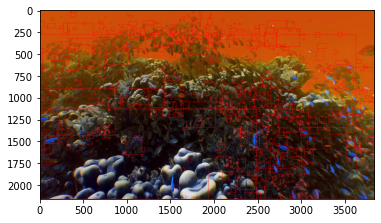

In [ ]:
import os
import numpy as np

path = "drive/MyDrive/Underwater_image_data/Underwater_video/"

if not os.path.exists(path+"plot"):
  os.mkdir(path+"plot")

if not os.path.exists(path+"data"):
  os.mkdir(path+"data")

path2 = path+"plot"+"/"
path3 = path+"data"+"/"

videos = [i for i in os.listdir(path)]

from skimage import io



import cv2
import matplotlib.pyplot as plt


print("The name of the video is: {}. \nWould you like to approach with this video? Yes/No. \nIf No, please enter the index number of video address.\n\n".format(videos[1]))

yn = input()

m = 1
if yn == "No":
  m = int(input())
else:pass

cap=cv2.VideoCapture(path+videos[m])

ret1,frame1= cap.read()
gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
gray1 = cv2.GaussianBlur(gray1, (21, 21), 0)
plt.imshow(frame1)

plt.title("Unlocalized original image\n\n".format(t = num+1, m= m))

plt.savefig(path2+"video"+str(m)+"original_image"+".png")
plt.show()

num = 0

motion_cord_set = []
while(num<50):
    ret2,frame2=cap.read()
    gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.GaussianBlur(gray2, (21, 21), 0)
    
    deltaframe=cv2.absdiff(gray1,gray2)
    #plt.imshow(deltaframe)
    threshold = cv2.threshold(deltaframe, 25, 255, cv2.THRESH_BINARY)[1]
    threshold = cv2.dilate(threshold,None)
    #plt.imshow(threshold)
    countour,heirarchy = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    motion_cordI = []
    
    for i in countour:
        if cv2.contourArea(i) < 50:
            continue
 
        (x, y, w, h) = cv2.boundingRect(i)
        cv2.rectangle(frame2, (x, y), (x + w, y + h), (255, 0, 0), 2)

        motion_cordI.append((w,h))

        


    motion_cord_set.append(np.array(motion_cordI))

    
    plt.imshow(frame2)

    

    plt.title("Localization of the objects for the time-index-{t} \n and for the video no {m} with time\n\n".format(t = num+1, m= m))

    plt.savefig(path2+"Distance"+"video"+str(m)+str(num+1)+".png")
    plt.show()
    

  
    if cv2.waitKey(20) == ord('q'):
      break

    num+=1


motion_cord_set = np.array(motion_cord_set)
plt.imshow(frame2)
plt.show()


cap.release()
cv2.destroyAllWindows()

In [ ]:
distI = []
dist = []

angleI = []
angle = []


for i in motion_cord_set:
  for j,k in i:
    dist_ = (j**2+k**2)**0.5

    distI.append(dist_)
    
    if k==0:
      k = 0.0001

    angle_ = np.arctan(j/k)
    angleI.append(angle_)

  dist.append(distI)
  angle.append(angleI)
  
import pandas as pd

dic = {"distance":dist,
       "angle":angle}


dt = pd.DataFrame(dic)

dt.to_csv(path3+"motion_data"+"video"+str(m)+".csv", index = False)


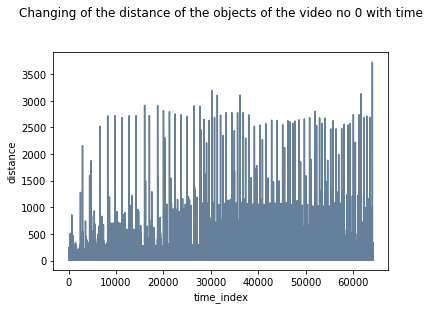

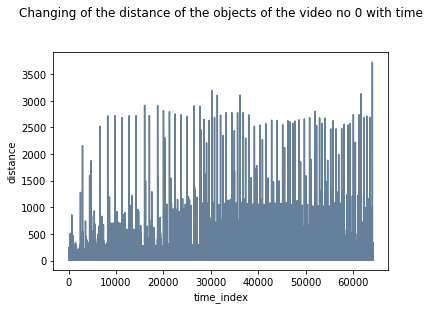

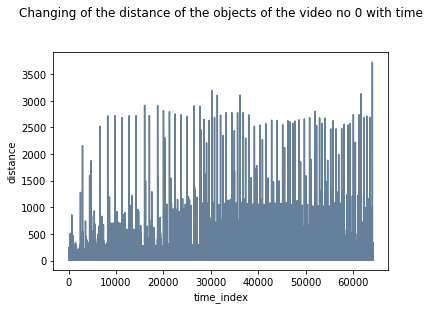

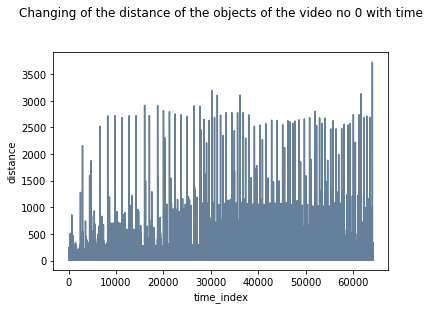

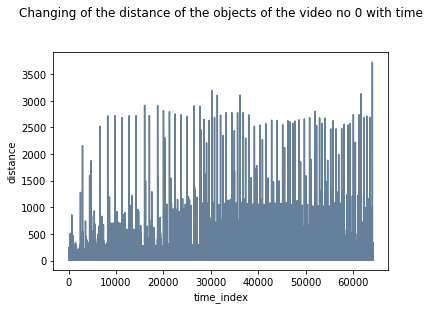

...

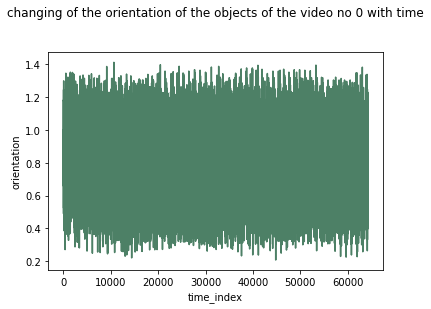

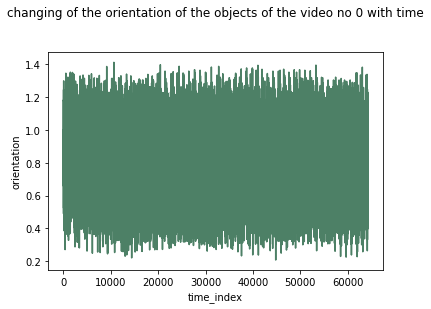

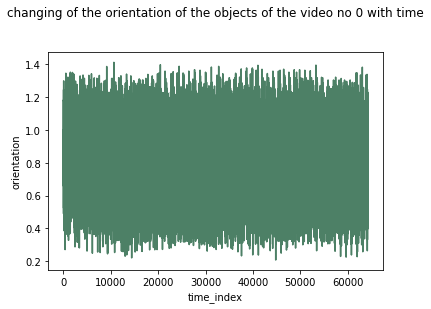

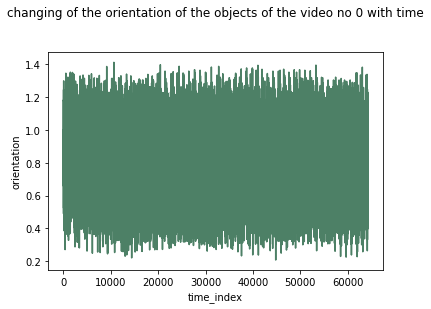

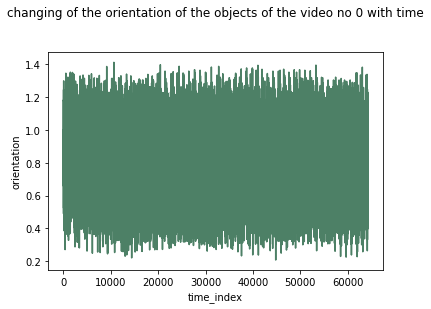

In [ ]:



for i in dist:
  plt.plot(i, c = (0.4, 0.5, 0.6))

  plt.xlabel("time_index")

  plt.ylabel("distance")

  plt.title("Changing of the distance of the objects of the video no {} with time\n\n".format(m))

  plt.savefig(path2+"Distance"+"video"+str(m)+str(dist.index(i))+".png")
  
  plt.show()

for i in angle:
  plt.plot(i, c = (0.3, 0.5, 0.4))

  plt.xlabel("time_index")

  plt.ylabel("orientation")

  plt.title("changing of the orientation of the objects of the video no {} with time\n\n".format(m))

  plt.savefig(path2+"Orientation"+"video"+str(m)+str(angle.index(i))+".png")

  plt.show()



In [113]:
import pandas as pd
import numpy as np

dt = pd.read_csv("drive/MyDrive/Underwater_image_data/Underwater_video/data/motion_datavideo0.csv")


d = []
for i in range(len(dt["distance"])):
  d_ = dt["distance"][i][i]
  d.append(d_)


a = []
for i in range(len(dt["angle"])):
  a_ = dt["angle"][i][i]
  a.append(d_)


dic = {"time":np.array([i for i in range(50)]),
       "distance":d,
       "angle":a}


dt = pd.DataFrame(dic)

dt.to_csv("drive/MyDrive/Underwater_image_data/Underwater_video/data/INmotion_datavideo0.csv", index = False)


dt = pd.read_csv("drive/MyDrive/Underwater_image_data/Underwater_video/data/motion_datavideo1.csv")


d = []
for i in range(len(dt["distance"])):
  d_ = dt["distance"][i][2]
  d.append(d_)


a = []
for i in range(len(dt["angle"])):
  a_ = dt["angle"][i][10]
  a.append(d_)


dic = {"time":np.array([i for i in range(50)]),
       "distance":d,
       "angle":a}


dt = pd.DataFrame(dic)

dt.to_csv("drive/MyDrive/Underwater_image_data/Underwater_video/data/INmotion_datavideo1.csv", index = False)


  


In [124]:
data = pd.read_csv("drive/MyDrive/Underwater_image_data/Underwater_video/data/INmotion_datavideo0.csv")


dt = pd.concat([data[1:3],data[4:18], data[20:23], data[24:39], data[41:43], data[44:]])


dic = {'time':dt['time'],
       'distance': dt['distance']}


dt_ = pd.DataFrame(dic)

dt_.to_csv("drive/MyDrive/Underwater_image_data/Underwater_video/data/DistanceNmotion_datavideo0.csv", index = False)



